In [1]:
# Navigate to the root of the project and import necessary libraries

import sys
import os
from pathlib import Path

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

sys.path.append(os.path.abspath("../src"))
# We change the working directory to the root of the project
# Run this only once
root_path = Path.cwd().parent
os.chdir(root_path)
sys.path.append(root_path / "src")

# Testing our Flow module, in 2D

The objective of this notebook is to test flow matching on simple 2D datasets, by testing:
- If the paths, schedulers and sampling works properly
- If the target velocities makes sense
- If we can train a flow model
- If the velocity field for this model makes sense
- If the model samples correctly
- If we can condition the generations using classifier guidance

We also:
- Visualize our trajectories
- Experiment with rectifying our flows (?)

We expect that if our module works with 2D examples, it will work with n-d examples, for image-to-image generation.

First, we begin by loading and visualizing a dataset:

In [2]:
from experiments.datasets.datasets import GMM2GMM, get_first_example_dataset, get_second_example_dataset
from torch.utils.data import DataLoader

# First example: GMM with 2 components -> GMM with 3 components
# Second example: Gaussian -> GMM with 5 components

n_points = 500000

# dataset = get_first_example_dataset(n_points)
dataset = get_second_example_dataset(n_points)
loader = DataLoader(dataset, batch_size=512, shuffle=True)

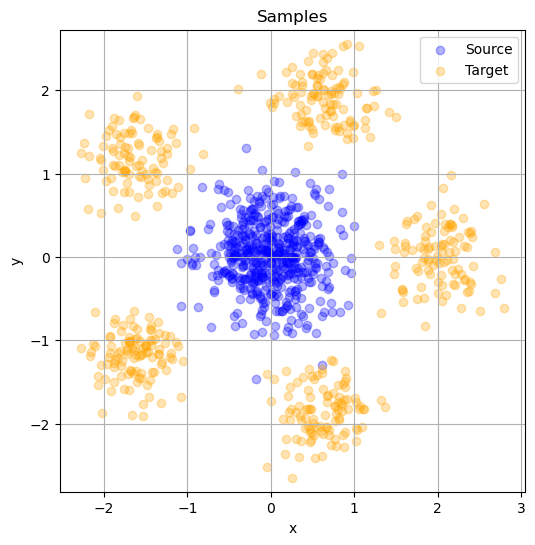

In [3]:
# Let's visualize the first batch
from src.experiments.visualization.plots import *
batch = next(iter(loader))
x0, x1, y = batch
scatter_points(x0, x1)

##### Let's load a toy flow model:

We use hydra to specify our models in configuration files, to simplify the loading process, experiments, and configuration management:

In [4]:
from hydra.utils import instantiate
from omegaconf import OmegaConf
from src.flows.types import Predicts
os.environ["HYDRA_FULL_ERROR"] = "1"

model_cfg = OmegaConf.load("confs/toy_flow.yaml")
model_cfg.flow_model.cfg.predicts = Predicts.from_any('x0')

flow_model = instantiate(model_cfg.flow_model)

/home/mathis/anaconda3/lib/python3.12/site-packages/pytorch_lightning/utilities/parsing.py:209: Attribute 'path' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['path'])`.


**Sampling and target velocities test**:

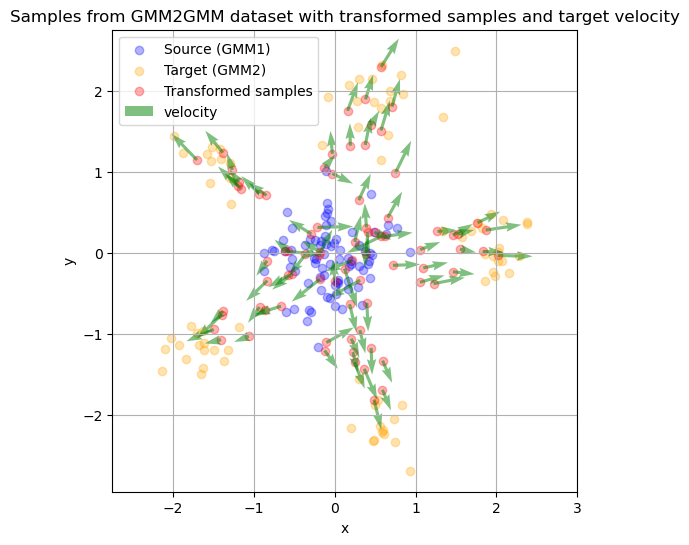

In [5]:
loader = DataLoader(dataset, batch_size=80, shuffle=True)
x0, x1, y = next(iter(loader))

t, x_t = flow_model.path.sample(x_0=x0, x_1=x1)
target_vectors = flow_model.path.target_velocity(t, x0, x1)
scatter_points_with_velocity(x0, x1, x_t, target_vectors)

**Training step test:**

In [6]:
flow_model.training_step((x0, x1), 0)

/home/mathis/anaconda3/lib/python3.12/site-packages/pytorch_lightning/core/module.py:441: You are trying to `self.log()` but the `self.trainer` reference is not registered on the model yet. This is most likely because the model hasn't been passed to the `Trainer`


tensor(0.1451, grad_fn=<MseLossBackward0>)

**Fully training a model:**

In [7]:
import logging
logging.basicConfig(level=logging.INFO)

loader = DataLoader(dataset, batch_size=1000, shuffle=True)

# Load the trainer configuration and instantiate the trainer
# We use pytorch_lightning for training, which is a high-level wrapper for PyTorch
# This permits us to easily train our model with features like GPU support, logging, and more
# It also allows us to easily train our model on multiple GPUs
trainer_cfg = OmegaConf.load("confs/toy_trainer.yaml")
trainer = instantiate(trainer_cfg.trainer)

# train the model
trainer.fit(flow_model, train_dataloaders=loader)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/mathis/anaconda3/lib/python3.12/site-packages/pytorch_lightning/trainer/configuration_validator.py:70: You defined a `validation_step` but have no `val_dataloader`. Skipping val loop.
wandb: Currently logged in as: mathis-wauquiez (mathis-wauquiez-cole-des-ponts-paristech) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type               | Params | Mode 
-----------------------------------------------------
0 | path  | AffinePath         | 0      | train
1 | model | TimeConditionedMLP | 13.3 K | train
-----------------------------------------------------
13.3 K    Trainable params
0         Non-trainable params
13.3 K    Total params
0.053     Total estimated model params size (MB)
13        Modules in train mode
0         Modules in eval mode
/home/mathis/anaconda3/lib/python3.12/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=7` in the `DataLoader` to improve performance.


Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=3` reached.


Let's test the estimated velocities:

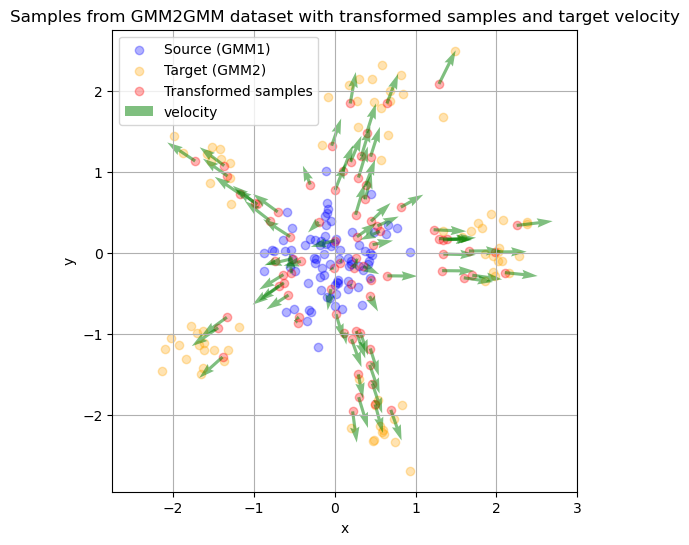

In [8]:
flow_model.eval()
flow_model.path.eval()

t, x_t= flow_model.path.sample(x_0=x0, x_1=x1)
v = flow_model.estimated_velocity(t, x_t).detach()

scatter_points_with_velocity(x0, x1, x_t, v)

**We visualize the velocity field (or the score) at different timesteps:**

In [9]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import HTML

def estimate_score(t, x_t):
    if (t==0).any() or (t==1).any():
        return torch.zeros_like(x_t)+0.1
    v = flow_model.path.estimated_velocity(t, x_t)
    score= flow_model.path.convert_parameterization(t, x_t, v, "v", "score")
    normalized_score = score / torch.norm(score, dim=1, keepdim=True)
    return normalized_score/5


def estimate_velocity(t, x_t, norm = True):
    v = flow_model.estimated_velocity(t, x_t)
    return v / torch.norm(v, dim=1, keepdim=True).max() if norm else v

ani = animate_estimated_velocity(x0, x1, estimate_velocity, device='cpu')
HTML(ani.to_jshtml())

INFO:matplotlib.animation:Animation.save using <class 'matplotlib.animation.HTMLWriter'>


In [10]:
animate_sampled_trajectories(
    flow_model,
    dataset,
    samples=500,
)

INFO:matplotlib.animation:Animation.save using <class 'matplotlib.animation.HTMLWriter'>


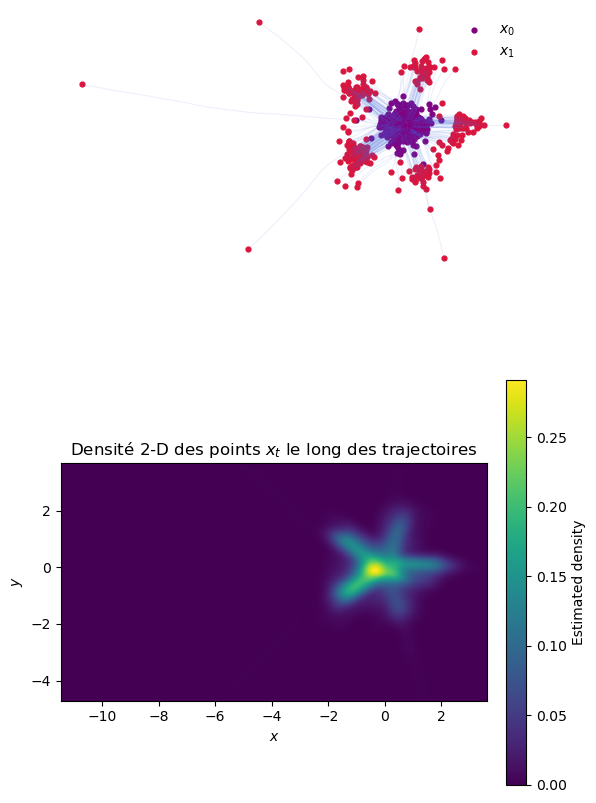

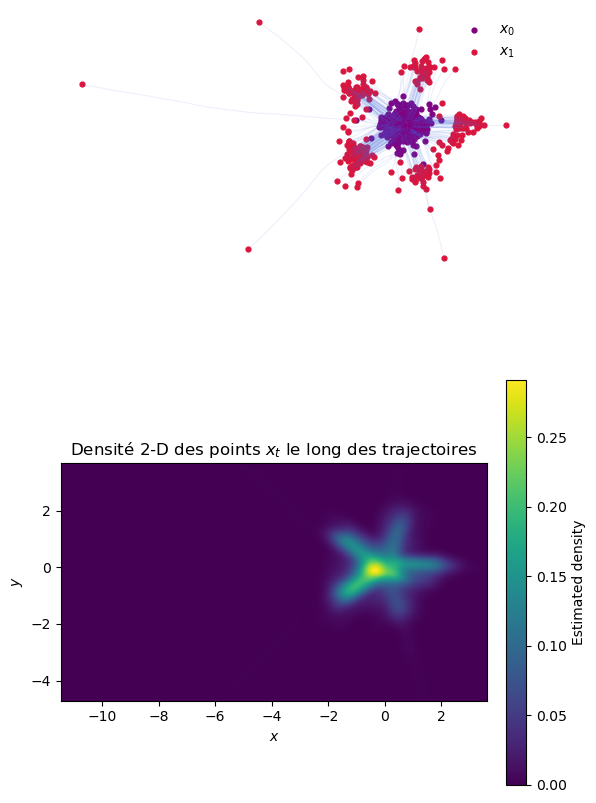

In [11]:
plot_trajectories_with_density(
    flow_model=flow_model,
    dataset=dataset,
    N=300
)

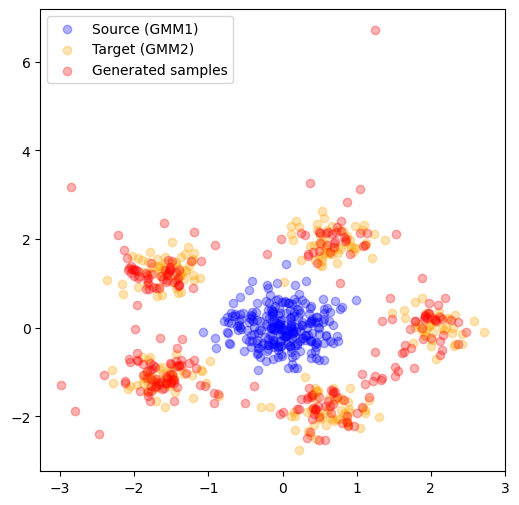

In [12]:
loader = DataLoader(dataset, batch_size=256, shuffle=True)
x0, x1, y = next(iter(loader))
gen = flow_model.sample(x0)
plt.figure(figsize=(6, 6))
plt.scatter(x0[:, 0], x0[:, 1], color='blue', alpha=0.3, label='Source (GMM1)')
plt.scatter(x1[:, 0], x1[:, 1], color='orange', alpha=0.3, label='Target (GMM2)')

plt.scatter(gen[:, 0], gen[:, 1], color='red', alpha=0.3, label='Generated samples')
plt.legend()



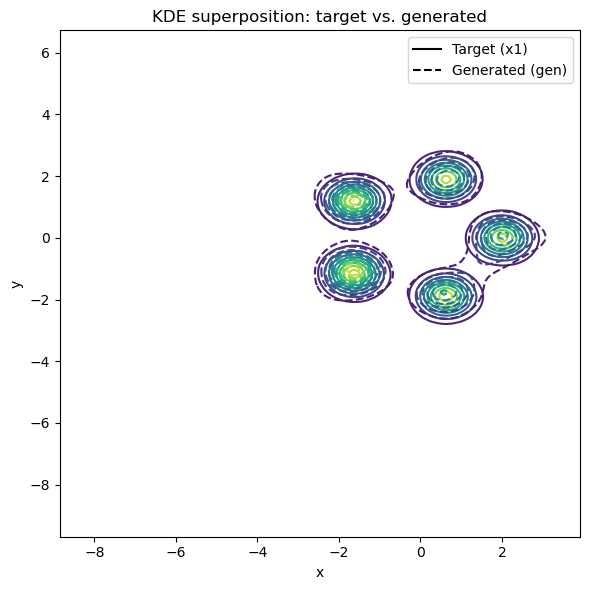

In [13]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde

def plot_kde(x1, gen, levels=10, gridsize=150j):
    """
    Draws superimposed KDE contours of x1 (target) and gen (generated).

    Parameters
    ----------
    x1, gen : (N, 2) torch tensors or NumPy arrays
    levels  : int      – number of contour levels
    gridsize: slice    – mesh resolution, e.g. 150j → 150×150 grid
    """
    # ensure NumPy
    x1_np  = x1.detach().cpu().numpy() if hasattr(x1, "detach") else np.asarray(x1)
    gen_np = gen.detach().cpu().numpy() if hasattr(gen, "detach") else np.asarray(gen)

    # KDEs
    kde_x1  = gaussian_kde(x1_np.T)
    kde_gen = gaussian_kde(gen_np.T)

    # grid covering both clouds
    xmin = min(x1_np[:, 0].min(), gen_np[:, 0].min())
    xmax = max(x1_np[:, 0].max(), gen_np[:, 0].max())
    ymin = min(x1_np[:, 1].min(), gen_np[:, 1].min())
    ymax = max(x1_np[:, 1].max(), gen_np[:, 1].max())

    xx, yy = np.mgrid[xmin:xmax:gridsize, ymin:ymax:gridsize]
    grid   = np.vstack([xx.ravel(), yy.ravel()])

    # density values on the grid
    zz_x1  = kde_x1(grid).reshape(xx.shape)
    zz_gen = kde_gen(grid).reshape(xx.shape)

    # plot
    plt.figure(figsize=(6, 6))
    plt.contour(xx, yy, zz_x1, levels=levels, linestyles="solid")
    plt.contour(xx, yy, zz_gen, levels=levels, linestyles="dashed")

    # legend handles
    handles = [
        plt.Line2D([], [], linestyle="solid",  color="k", label="Target (x1)"),
        plt.Line2D([], [], linestyle="dashed", color="k", label="Generated (gen)"),
    ]
    plt.legend(handles=handles)
    plt.xlabel("x")
    plt.ylabel("y")
    plt.title("KDE superposition: target vs. generated")
    plt.tight_layout()
    plt.show()

loader = DataLoader(dataset, batch_size=10000, shuffle=True)
x0, x1, y = next(iter(loader))
gen = flow_model.sample(x0)
plot_kde(x1, gen)


In [14]:
import torch.nn as nn
from experiments.models.models import create_MLP

classifier = create_MLP(2, 5, 64, 2)

classifier

Sequential(
  (0): Linear(in_features=2, out_features=64, bias=True)
  (1): ReLU()
  (2): Linear(in_features=64, out_features=64, bias=True)
  (3): ReLU()
  (4): Linear(in_features=64, out_features=5, bias=True)
)

Epoch 0: loss = 1.6855673789978027
Epoch 10: loss = 1.3387048244476318
Epoch 20: loss = 1.0315179824829102
Epoch 30: loss = 0.735684871673584
Epoch 40: loss = 0.47632792592048645
Epoch 50: loss = 0.2849990129470825
Epoch 60: loss = 0.1713981330394745
Epoch 70: loss = 0.10938560962677002
Epoch 80: loss = 0.07412505894899368
Epoch 90: loss = 0.05345373600721359


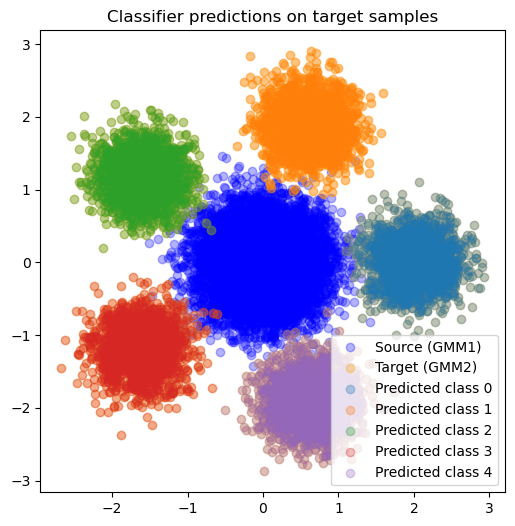

In [15]:
# train the classifier

epochs = 100
lr = 1e-3

optimizer = torch.optim.Adam(classifier.parameters(), lr=lr)
criterion = nn.CrossEntropyLoss()

classifier.train()
for i in range(epochs):
    optimizer.zero_grad()
    x0, x1, y = next(iter(loader))
    
    preds = classifier(x1)
    loss = criterion(preds, y)
    loss.backward()
    optimizer.step()

    if i % 10 == 0:
        print(f"Epoch {i}: loss = {loss.item()}")

classifier.eval()
x0, x1, y = next(iter(loader))
preds = classifier(x1)
preds = torch.argmax(preds, dim=1)
plt.figure(figsize=(6, 6))
plt.scatter(x0[:, 0], x0[:, 1], color='blue', alpha=0.3, label='Source (GMM1)')
plt.scatter(x1[:, 0], x1[:, 1], color='orange', alpha=0.3, label='Target (GMM2)')

for i in range(5):
    plt.scatter(x1[preds == i][:, 0], x1[preds == i][:, 1], alpha=0.3, label=f'Predicted class {i}')

plt.legend()
plt.title("Classifier predictions on target samples")
plt.show()


In [16]:
model_cfg = OmegaConf.load("confs/toy_flow_cls.yaml")
model_cfg.flow_model.cfg.predicts = Predicts.from_any('x0')
model_cfg.flow_model.cfg.guidance_scale = 0.1


flow_model_cls = instantiate(model_cfg.flow_model, classifier=classifier)
flow_model_cls.model = flow_model.model

/home/mathis/anaconda3/lib/python3.12/site-packages/pytorch_lightning/utilities/parsing.py:209: Attribute 'path' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['path'])`.


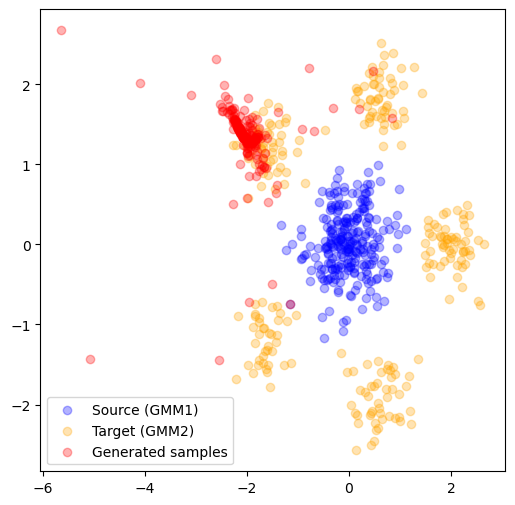

In [17]:

loader = DataLoader(dataset, batch_size=256, shuffle=True)
x0, x1, y = next(iter(loader))

y = torch.ones(x0.shape[0], dtype=torch.long) * 2


gen = flow_model_cls.sample(x0, y=y)
plt.figure(figsize=(6, 6))
plt.scatter(x0[:, 0], x0[:, 1], color='blue', alpha=0.3, label='Source (GMM1)')
plt.scatter(x1[:, 0], x1[:, 1], color='orange', alpha=0.3, label='Target (GMM2)')

plt.scatter(gen[:, 0], gen[:, 1], color='red', alpha=0.3, label='Generated samples')
plt.legend()



**Note**: The results of the classifier guidance are not that great. This is to be expected, as the gradients in the early step of the flow, when $t<<1$, are quite unreliable. Indeed, the classifier is not really trained for points from the initial distribution. It's a bit like following of the gradients for some classification task, except the images are pure noise. This is why, in this case, classifier-free guidance is a more adequate choice for guidance.

In [18]:
animate_sampled_trajectories(
    flow_model_cls,
    dataset,
    samples=500,
    y=0
)

INFO:matplotlib.animation:Animation.save using <class 'matplotlib.animation.HTMLWriter'>


In [19]:
model_cfg = OmegaConf.load("confs/toy_flow_cfg.yaml")
model_cfg.flow_model.cfg.guidance_scale = 1


flow_model_cfg = instantiate(model_cfg.flow_model)

trainer = instantiate(trainer_cfg.trainer)
trainer.fit(flow_model_cfg, train_dataloaders=loader)


/home/mathis/anaconda3/lib/python3.12/site-packages/pytorch_lightning/utilities/parsing.py:209: Attribute 'path' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['path'])`.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/mathis/anaconda3/lib/python3.12/site-packages/pytorch_lightning/trainer/configuration_validator.py:70: You defined a `validation_step` but have no `val_dataloader`. Skipping val loop.
/home/mathis/anaconda3/lib/python3.12/site-packages/pytorch_lightning/loggers/wandb.py:397: There is a wandb run already in progress and newly created instances of `WandbLogger` will reuse this run. If this is not desired, call `wandb.finish()` before instantiating `WandbLogger`.
/home/mathis/anaconda3/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory wandb/StageTests

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=3` reached.


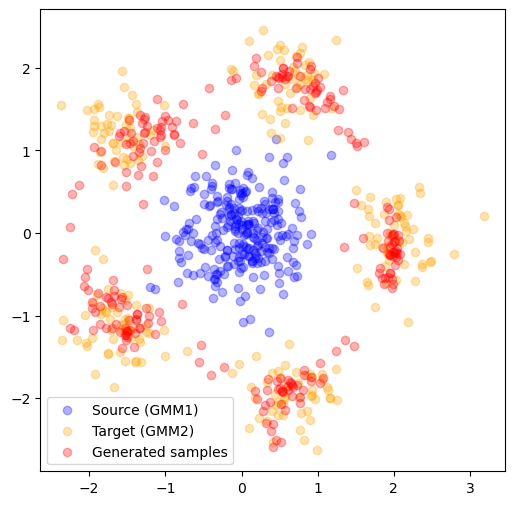

In [38]:
loader = DataLoader(dataset, batch_size=256, shuffle=True)
x0, x1, y = next(iter(loader))

y = torch.ones(x0.shape[0], dtype=torch.long) * 2


gen = flow_model_cfg.sample(x0)
plt.figure(figsize=(6, 6))
plt.scatter(x0[:, 0], x0[:, 1], color='blue', alpha=0.3, label='Source (GMM1)')
plt.scatter(x1[:, 0], x1[:, 1], color='orange', alpha=0.3, label='Target (GMM2)')

plt.scatter(gen[:, 0], gen[:, 1], color='red', alpha=0.3, label='Generated samples')
plt.legend()



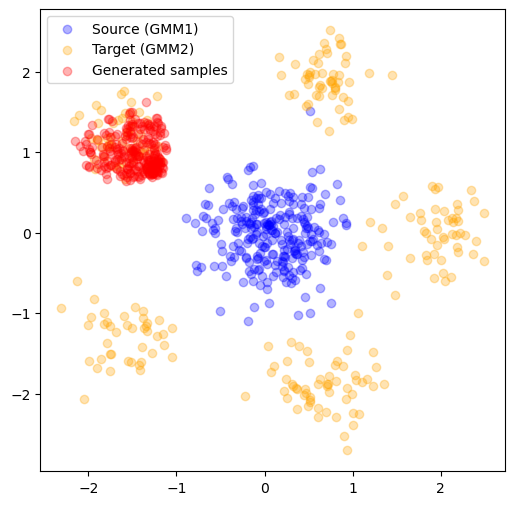

In [22]:
loader = DataLoader(dataset, batch_size=256, shuffle=True)
x0, x1, y = next(iter(loader))

y = torch.ones(x0.shape[0], dtype=torch.long) * 2


gen = flow_model_cfg.sample(x0, y=y)
plt.figure(figsize=(6, 6))
plt.scatter(x0[:, 0], x0[:, 1], color='blue', alpha=0.3, label='Source (GMM1)')
plt.scatter(x1[:, 0], x1[:, 1], color='orange', alpha=0.3, label='Target (GMM2)')

plt.scatter(gen[:, 0], gen[:, 1], color='red', alpha=0.3, label='Generated samples')
plt.legend()



In [ ]:
animate_sampled_trajectories(
    flow_model_cfg,
    dataset,
    samples=500,
    y=0
)

INFO:matplotlib.animation:Animation.save using <class 'matplotlib.animation.HTMLWriter'>
